# Project 2: Breakout Strategy
## Instructions
Each problem consists of a function to implement and instructions on how to implement the function.  The parts of the function that need to be implemented are marked with a `# TODO` comment. After implementing the function, run the cell to test it against the unit tests we've provided. For each problem, we provide one or more unit tests from our `project_tests` package. These unit tests won't tell you if your answer is correct, but will warn you of any major errors. Your code will be checked for the correct solution when you submit it to Udacity.

## Packages
When you implement the functions, you'll only need to you use the packages you've used in the classroom, like [Pandas](https://pandas.pydata.org/) and [Numpy](http://www.numpy.org/). These packages will be imported for you. We recommend you don't add any import statements, otherwise the grader might not be able to run your code.

The other packages that we're importing are `helper`, `project_helper`, and `project_tests`. These are custom packages built to help you solve the problems.  The `helper` and `project_helper` module contains utility functions and graph functions. The `project_tests` contains the unit tests for all the problems.

### Install Packages

In [1]:
import sys
!{sys.executable} -m pip install -r requirements.txt

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


### Load Packages

In [23]:
import pandas as pd
import numpy as np
import helper
import project_helper
import project_tests

## Market Data
### Load Data
While using real data will give you hands on experience, it's doesn't cover all the topics we try to condense in one project. We'll solve this by creating new stocks. We've create a scenario where companies mining [Terbium](https://en.wikipedia.org/wiki/Terbium) are making huge profits. All the companies in this sector of the market are made up. They represent a sector with large growth that will be used for demonstration latter in this project.

Embora o uso de dados reais proporcione experiência prática, eles não cobrem todos os tópicos que tentamos condensar em um projeto. Vamos resolver isso criando novas ações. Criamos um cenário em que as empresas de mineração de [Terbium](https://en.wikipedia.org/wiki/Terbium) estão obtendo enormes lucros. Todas as empresas desse setor do mercado estão crescendo. Eles representam um setor com grande crescimento que será usado para demonstração posteriormente neste projeto.

In [31]:
#df_original = pd.read_csv('../../data/project_2/eod-quotemedia.csv', parse_dates=['date'], index_col=False)
df_original = pd.read_excel('data/dfa_h1_b3.xlsx', parse_dates=['date'], index_col=False)

# Add TB sector to the market
df = df_original
#df = pd.concat([df] + project_helper.generate_tb_sector(df[df['ticker'] == 'AAPL']['date']), ignore_index=True)

close = df.reset_index().pivot(index='date', columns='ticker', values='adj_close').dropna()
high = df.reset_index().pivot(index='date', columns='ticker', values='adj_high').dropna()
low = df.reset_index().pivot(index='date', columns='ticker', values='adj_low').dropna()

print('Loaded Data')

Loaded Data


In [19]:
#df_original.head()
#df.head()
#(close<high).head()
#(close>low & close<high).head()
#(close         ).head()
#((close+high+low)>close*3).head()
#(close-high).head()
#((close-high)/((close-high)*-1)).head()
#close

In [32]:
close_high = lambda s1, s2: s1 if s1>s2 else s2

In [33]:
# dando preferencia ao valor do primeiro dataframe a menos que ele seja nulo
close.combine_first(high).head()

ticker,ABEV3,AERI3,ALPA4,ALSO3,AMBP3,AMER3,ANIM3,ASAI3,AZUL4,B3SA3,...,TAEE11,TOTS3,USIM5,VALE3,VAMO3,VBBR3,VIIA3,WEGE3,XPBR31,YDUQ3
date,,,,,,,,,,,,,,,,,,,,,
2022-01-17 17:00:00,14.82000000,6.02000000,31.02000000,19.45000000,34.94000000,30.53000000,6.99000000,12.01000000,26.01000000,12.42000000,...,34.29000000,25.37000000,16.18000000,81.37000000,10.14000000,19.62000000,3.90000000,30.41000000,159.00000000,19.11000000
2022-01-17 18:00:00,14.80000000,6.00000000,30.98000000,19.45000000,35.00000000,30.47000000,6.92000000,12.01000000,25.82000000,12.36000000,...,34.21000000,25.29000000,16.23000000,81.13000000,10.20000000,19.53000000,3.90000000,30.35000000,158.00000000,19.07000000
2022-01-18 10:00:00,14.48000000,5.95000000,29.37000000,19.63000000,34.07000000,30.60000000,6.98000000,11.93000000,25.56000000,12.19000000,...,34.34000000,25.03000000,16.36000000,82.13000000,9.99000000,19.64000000,3.84000000,30.65000000,156.86000000,19.21000000
2022-01-18 11:00:00,14.41000000,5.93000000,28.95000000,19.47000000,34.18000000,30.51000000,6.95000000,11.92000000,25.69000000,12.14000000,...,34.41000000,24.72000000,16.33000000,83.12000000,9.79000000,19.59000000,3.80000000,30.53000000,155.80000000,19.20000000
2022-01-18 12:00:00,14.50000000,5.97000000,28.91000000,19.48000000,33.89000000,30.90000000,7.05000000,11.94000000,25.81000000,12.22000000,...,34.32000000,24.80000000,16.42000000,83.29000000,9.77000000,19.63000000,3.83000000,30.32000000,154.92000000,19.69000000


In [34]:
close.compare(high).head()

ticker                    ABEV3                  AERI3                  ALPA4  \
                           self       other       self      other        self   
date                                                                            
2022-01-17 17:00:00 14.82000000 14.83000000 6.02000000 6.04000000 31.02000000   
2022-01-18 10:00:00 14.48000000 14.74000000 5.95000000 6.03000000 29.37000000   
2022-01-18 11:00:00 14.41000000 14.52000000 5.93000000 6.02000000 28.95000000   
2022-01-18 12:00:00 14.50000000 14.54000000 5.97000000 5.98000000 28.91000000   
2022-01-18 13:00:00         NaN         NaN 5.99000000 6.00000000         NaN   

ticker                                ALSO3                   AMBP3  \
                          other        self       other        self   
date                                                                  
2022-01-17 17:00:00 31.16000000 19.45000000 19.54000000 34.94000000   
2022-01-18 10:00:00 30.81000000 19.63000000 19.66000000 34.07000000   
2022-01-18 11:00:00 29.55000000 19.47000000 19.71000000 34.18000000   
2022-01-18 12:00:00 29.36000000 19.48000000 19.60000000 33.89000000   
2022-01-18 13:00:00         NaN 19.62000000 19.67000000 33.99000000   

ticker                           ...       VBBR3                  VIIA3  \
                          other  ...        self       other       self   
date                             ...                                      
2022-01-17 17:00:00 35.14000000  ... 19.62000000 19.75000000 3.90000000   
2022-01-18 10:00:00 35.00000000  ... 19.64000000 19.68000000 3.84000000   
2022-01-18 11:00:00 34.82000000  ... 19.59000000 19.74000000 3.80000000   
2022-01-18 12:00:00 34.24000000  ... 19.63000000 19.75000000 3.83000000   
2022-01-18 13:00:00 34.13000000  ... 19.68000000 19.72000000 3.84000000   

ticker                               WEGE3                   XPBR31  \
                         other        self       other         self   
date                                                                  
2022-01-17 17:00:00 3.92000000 30.41000000 30.43000000 159.00000000   
2022-01-18 10:00:00 3.88000000 30.65000000 30.70000000 156.86000000   
2022-01-18 11:00:00 3.89000000 30.53000000 30.78000000 155.80000000   
2022-01-18 12:00:00 3.85000000 30.32000000 30.58000000 154.92000000   
2022-01-18 13:00:00 3.86000000 30.39000000 30.48000000 154.69000000   

ticker                                 YDUQ3              
                           other        self       other  
date                                                      
2022-01-17 17:00:00 159.30000000         NaN         NaN  
2022-01-18 10:00:00 158.00000000 19.21000000 19.28000000  
2022-01-18 11:00:00 157.32000000 19.20000000 19.45000000  
2022-01-18 12:00:00 158.00000000         NaN         NaN  
2022-01-18 13:00:00 155.49000000 19.80000000 19.93000000  

[5 rows x 196 columns]

In [30]:
dfcopia = pd.read_csv('data/eod-quotemedia.csv', parse_dates=['date'], index_col=False)
dfcopia.to_csv('C:\\Users\\Usuario\\OneDrive\\work2\\workspace\\workspace-ai-4-trading-nanodegree\\aula-15-projeto-02\\teste.csv')
#dfcopia.to_csv('/c/Users/Usuario/OneDrive/work2/workspace/workspace-ai-4-trading-nanodegree/aula-15-projeto-02/teste2.csv')

dfcopia

,date,ticker,adj_close,adj_high,adj_low
0,2013-07-01,A,29.99418563,30.11804324,29.52627909
1,2013-07-02,A,29.65013670,30.20061499,29.55380300
2,2013-07-03,A,29.70518453,29.90473291,29.39554049
3,2013-07-05,A,30.43456826,30.47929462,29.86344704
4,2013-07-08,A,30.52402098,30.73733132,30.35887750
5,2013-07-09,A,30.68916447,30.93687970,30.51025902
6,2013-07-10,A,31.17771395,31.41166722,30.62723566
7,2013-07-11,A,31.45983407,31.63873951,31.26028569
8,2013-07-12,A,31.48047700,31.61809658,31.36611514
9,2013-07-15,A,31.72819223,31.84172838,31.43231015


### View Data
To see what one of these 2-d matrices looks like, let's take a look at the closing prices matrix.

In [35]:
close

ticker,ABEV3,AERI3,ALPA4,ALSO3,AMBP3,AMER3,ANIM3,ASAI3,AZUL4,B3SA3,...,TAEE11,TOTS3,USIM5,VALE3,VAMO3,VBBR3,VIIA3,WEGE3,XPBR31,YDUQ3
date,,,,,,,,,,,,,,,,,,,,,
2022-01-17 17:00:00,14.82000000,6.02000000,31.02000000,19.45000000,34.94000000,30.53000000,6.99000000,12.01000000,26.01000000,12.42000000,...,34.29000000,25.37000000,16.18000000,81.37000000,10.14000000,19.62000000,3.90000000,30.41000000,159.00000000,19.11000000
2022-01-17 18:00:00,14.80000000,6.00000000,30.98000000,19.45000000,35.00000000,30.47000000,6.92000000,12.01000000,25.82000000,12.36000000,...,34.21000000,25.29000000,16.23000000,81.13000000,10.20000000,19.53000000,3.90000000,30.35000000,158.00000000,19.07000000
2022-01-18 10:00:00,14.48000000,5.95000000,29.37000000,19.63000000,34.07000000,30.60000000,6.98000000,11.93000000,25.56000000,12.19000000,...,34.34000000,25.03000000,16.36000000,82.13000000,9.99000000,19.64000000,3.84000000,30.65000000,156.86000000,19.21000000
2022-01-18 11:00:00,14.41000000,5.93000000,28.95000000,19.47000000,34.18000000,30.51000000,6.95000000,11.92000000,25.69000000,12.14000000,...,34.41000000,24.72000000,16.33000000,83.12000000,9.79000000,19.59000000,3.80000000,30.53000000,155.80000000,19.20000000
2022-01-18 12:00:00,14.50000000,5.97000000,28.91000000,19.48000000,33.89000000,30.90000000,7.05000000,11.94000000,25.81000000,12.22000000,...,34.32000000,24.80000000,16.42000000,83.29000000,9.77000000,19.63000000,3.83000000,30.32000000,154.92000000,19.69000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-08 17:00:00,14.35000000,2.66000000,20.55000000,16.74000000,24.65000000,15.90000000,4.27000000,15.29000000,12.46000000,11.46000000,...,39.07000000,24.80000000,8.63000000,75.19000000,11.49000000,16.58000000,2.44000000,27.24000000,97.10000000,14.81000000
2022-07-11 10:00:00,14.25000000,2.60000000,19.82000000,16.29000000,24.07000000,15.46000000,4.24000000,15.19000000,11.77000000,10.94000000,...,39.18000000,23.96000000,8.40000000,73.30000000,11.12000000,16.45000000,2.34000000,26.53000000,93.44000000,14.54000000
2022-07-11 11:00:00,14.17000000,2.64000000,19.73000000,16.43000000,23.86000000,15.58000000,4.32000000,15.16000000,11.69000000,10.88000000,...,39.10000000,23.93000000,8.45000000,72.90000000,11.07000000,16.29000000,2.33000000,26.44000000,93.54000000,14.37000000


### Stock Example
Let's see what a single stock looks like from the closing prices. For this example and future display examples in this project, we'll use Apple's stock (AAPL). If we tried to graph all the stocks, it would be too much information.

Vamos ver a aparência de uma única ação a partir dos preços de fechamento. Para este exemplo e exemplos de exibição futuros neste projeto, usaremos o estoque da Apple (AAPL). Se tentássemos representar graficamente todas as ações, seria muita informação.

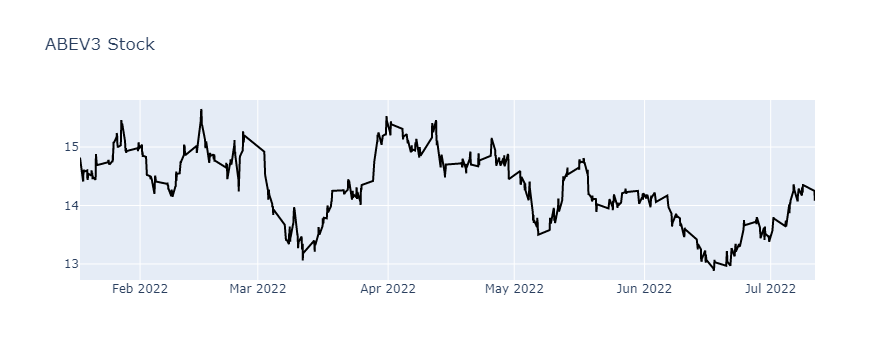

In [36]:
apple_ticker = 'ABEV3'
project_helper.plot_stock(close[apple_ticker], '{} Stock'.format(apple_ticker))

## The Alpha Research Process

In this project you will code and evaluate a "breakout" signal. It is important to understand where these steps fit in the alpha research workflow. The signal-to-noise ratio in trading signals is very low and, as such, it is very easy to fall into the trap of _overfitting_ to noise. It is therefore inadvisable to jump right into signal coding. To help mitigate overfitting, it is best to start with a general observation and hypothesis; i.e., you should be able to answer the following question _before_ you touch any data:**Neste projeto você irá codificar e avaliar um sinal de "breakout". É importante entender onde essas etapas se encaixam no fluxo de trabalho da pesquisa alfa. A relação sinal-ruído nos sinais de negociação é muito baixa e, como tal, é muito fácil cair na armadilha do overfitting ao ruído. Portanto, é desaconselhável pular direto para a codificação de sinal. Para ajudar a mitigar o overfitting, é melhor começar com uma observação geral e uma hipótese; ou seja, você deve ser capaz de responder à seguinte pergunta antes de tocar em qualquer dado:**

> What feature of markets or investor behaviour would lead to a persistent anomaly that my signal will try to use? **Que característica dos mercados ou comportamento do investidor levaria a uma anomalia persistente que meu sinal tentará usar?**

Ideally the assumptions behind the hypothesis will be testable _before_ you actually code and evaluate the signal itself. The workflow therefore is as follows: **Idealmente, as suposições por trás da hipótese serão testáveis antes de você realmente codificar e avaliar o próprio sinal. O fluxo de trabalho, portanto, é o seguinte:**

![image](images/alpha_steps.png)

In this project, we assume that the first three steps area done ("observe & research", "form hypothesis", "validate hypothesis"). The hypothesis you'll be using for this project is the following:**Neste projeto, assumimos que as três primeiras etapas estão concluídas ("observar e pesquisar", "formar hipótese", "validar hipótese"). A hipótese que você usará para este projeto é a seguinte:**
- In the absence of news or significant investor trading interest, stocks oscillate in a range.**Na ausência de notícias ou interesse comercial significativo dos investidores, as ações oscilam em um intervalo.**
- Traders seek to capitalize on this range-bound behaviour periodically by selling/shorting at the top of the range and buying/covering at the bottom of the range. This behaviour reinforces the existence of the range.**Os traders procuram capitalizar esse comportamento limitado ao intervalo periodicamente, vendendo/vendendo a descoberto no topo do intervalo e comprando/cobrindo no fundo do intervalo. Esse comportamento reforça a existência do intervalo.**
- When stocks break out of the range, due to, e.g., a significant news release or from market pressure from a large investor:**Quando as ações saem do intervalo, devido, por exemplo, a um comunicado de imprensa significativo ou à pressão do mercado de um grande investidor:**
    - the liquidity traders who have been providing liquidity at the bounds of the range seek to cover their positions to mitigate losses, thus magnifying the move out of the range, _and_**os traders de liquidez que fornecem liquidez nos limites do intervalo procuram cobrir suas posições para mitigar as perdas, ampliando assim o movimento para fora do intervalo, _e_**
    - the move out of the range attracts other investor interest; these investors, due to the behavioural bias of _herding_ (e.g., [Herd Behavior](https://www.investopedia.com/university/behavioral_finance/behavioral8.asp)) build positions which favor continuation of the trend.**a mudança para fora do intervalo atrai o interesse de outros investidores; esses investidores, devido ao viés comportamental de _herding_ (por exemplo, [Herd Behavior](https://www.investopedia.com/university/behavioral_finance/behavioral8.asp)) constroem posições que favorecem a continuação da tendência.**


Using this hypothesis, let start coding..**Usando esta hipótese, vamos começar a codificar.**
## Compute the Highs and Lows in a Window
You'll use the price highs and lows as an indicator for the breakout strategy. In this section, implement `get_high_lows_lookback` to get the maximum high price and minimum low price over a window of days. The variable `lookback_days` contains the number of days to look in the past. Make sure this doesn't include the current day.

## O Processo de Pesquisa Alpha

Neste projeto, você codificará e avaliará um sinal de "fuga". É importante entender onde essas etapas se encaixam no fluxo de trabalho de pesquisa alfa. A relação sinal-ruído em sinais de negociação é muito baixa e, como tal, é muito fácil cair na armadilha de _overfitting_ para ruído. Portanto, não é aconselhável ir direto para a codificação do sinal. Para ajudar a mitigar o overfitting, é melhor começar com uma observação geral e uma hipótese; ou seja, você deve ser capaz de responder à seguinte pergunta _antes_ de tocar em qualquer dado:

> Qual característica dos mercados ou comportamento do investidor levaria a uma anomalia persistente que meu sinal tentaria usar?

Idealmente, as suposições por trás da hipótese serão testáveis _antes_ de você realmente codificar e avaliar o próprio sinal. O fluxo de trabalho, portanto, é o seguinte:

![image](images/alpha_steps.png)

In this project, we assume that the first three steps area done ("observe & research", "form hypothesis", "validate hypothesis"). The hypothesis you'll be using for this project is the following:
- In the absence of news or significant investor trading interest, stocks oscillate in a range.
- Traders seek to capitalize on this range-bound behaviour periodically by selling/shorting at the top of the range and buying/covering at the bottom of the range. This behaviour reinforces the existence of the range.
- When stocks break out of the range, due to, e.g., a significant news release or from market pressure from a large investor:
    - the liquidity traders who have been providing liquidity at the bounds of the range seek to cover their positions to mitigate losses, thus magnifying the move out of the range, _and_
    - the move out of the range attracts other investor interest; these investors, due to the behavioural bias of _herding_ (e.g., [Herd Behavior](https://www.investopedia.com/university/behavioral_finance/behavioral8.asp)) build positions which favor continuation of the trend.


Using this hypothesis, let start coding..
## Compute the Highs and Lows in a Window
You'll use the price highs and lows as an indicator for the breakout strategy. In this section, implement `get_high_lows_lookback` to get the maximum high price and minimum low price over a window of days. The variable `lookback_days` contains the number of days to look in the past. Make sure this doesn't include the current day.

Neste projeto, assumimos que as três primeiras etapas foram concluídas ("observar e pesquisar", "formar hipótese", "validar hipótese"). A hipótese que você usará para este projeto é a seguinte:
- Na ausência de notícias ou interesse significativo de negociação do investidor, as ações oscilam em uma faixa.
- Os comerciantes buscam capitalizar sobre esse comportamento limitado à faixa periodicamente, vendendo/operando a descoberto no topo da faixa e comprando/cobrindo na parte inferior da faixa. Esse comportamento reforça a existência do intervalo.
- Quando as ações saem da faixa, devido a, por exemplo, um comunicado de notícias significativo ou pressão de mercado de um grande investidor:
    - os negociantes de liquidez que têm fornecido liquidez nos limites do intervalo procuram cobrir suas posições para mitigar perdas, ampliando assim o movimento para fora do intervalo, _e_
    - o movimento fora da faixa atrai o interesse de outros investidores; esses investidores, devido ao viés comportamental de _herding_ (por exemplo, [Herd Behavior](https://www.investopedia.com/university/behavioral_finance/behavioral8.asp)) constroem posições que favorecem a continuação da tendência.


Usando essa hipótese, vamos começar a codificar..
## Calcule os altos e baixos em uma janela
Você usará os preços highs(altos) e lows(baixos) como um indicador para a estratégia de fuga. Nesta seção, implemente `get_high_lows_lookback` para obter o preço máximo alto e o preço mínimo baixo em uma janela de dias. A variável `lookback_days` contém o número de dias para olhar no passado. Certifique-se de que não inclui o dia atual.

In [37]:
def get_high_lows_lookback(high, low, lookback_days):
    """
    Get the highs and lows in a lookback window.
    
    Parameters
    ----------
    high         : DataFrame  High price for each ticker and date
    low          : DataFrame  Low price for each ticker and date
    lookback_days: int        The number of days to look back
    
    Returns
    -------
    lookback_high: DataFrame   Lookback high price for each ticker and date
    lookback_low : DataFrame   Lookback low price for each ticker and date
    """
    #TODO: Implement function
    lookback_high = high.shift(1).rolling(window = lookback_days).max()
    lookback_low  =  low.shift(1).rolling(window = lookback_days).min()
    
    return lookback_high, lookback_low

#project_tests.test_get_high_lows_lookback(get_high_lows_lookback)

### View Data
Let's use your implementation of `get_high_lows_lookback` to get the highs and lows for the past 50 days and compare it to it their respective stock.  Just like last time, we'll use Apple's stock as the example to look at.**Vamos usar sua implementação de get_high_lows_lookback para obter os altos e baixos dos últimos 50 dias e compará-los com suas respectivas ações. Assim como da última vez, usaremos o estoque da Apple como exemplo a ser observado.**

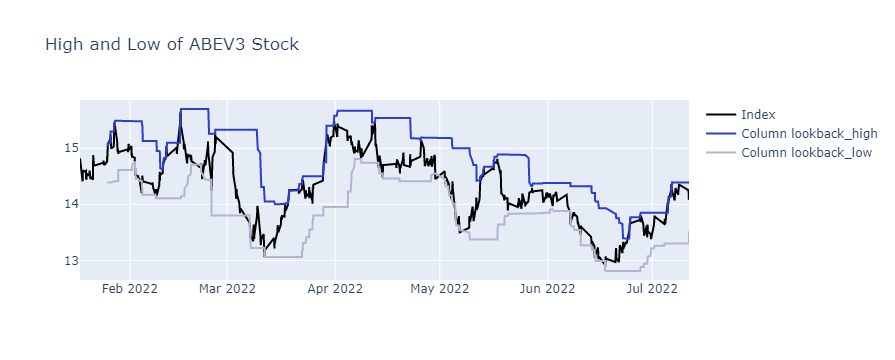

In [38]:
lookback_days = 50
lookback_high, lookback_low = get_high_lows_lookback(high, low, lookback_days)
project_helper.plot_high_low(
    close[apple_ticker],
    lookback_high[apple_ticker],
    lookback_low[apple_ticker],
    'High and Low of {} Stock'.format(apple_ticker))

In [46]:
close.to_excel("data/close.xlsx")
high.to_excel("data/high.xlsx")
low.to_excel("data/low.xlsx")
lookback_high.to_excel("data/lookback_high.xlsx")
lookback_low.to_excel("data/lookback_low.xlsx")
#close.tail()

In [45]:
#lookback_high.tail()

In [47]:
#lookback_low.tail()

In [53]:
#(lookback_low  > close).tail()
signal_plus = (lookback_high < close).astype(np.int64)
#signal_plus.tail()

In [54]:
signal_minus = (lookback_low > close).astype(np.int64)*-1
#signal_minus.tail()

In [57]:
signal = signal_minus + signal_plus
#signal.tail()

In [58]:
#values = [( row >= row.nlargest(top_n).min() ) for i,row in prev_returns.iterrows()]
cols = signal.columns
cols

Index(['ABEV3', 'AERI3', 'ALPA4', 'ALSO3', 'AMBP3', 'AMER3', 'ANIM3', 'ASAI3',
       'AZUL4', 'B3SA3', 'BBAS3', 'BBDC4', 'BBSE3', 'BEEF3', 'BOVA11',
       'BOVV11', 'BPAC11', 'BRAP4', 'BRFS3', 'BRKM5', 'BRML3', 'CASH3',
       'CBAV3', 'CCRO3', 'CEAB3', 'CIEL3', 'CMIG4', 'COGN3', 'CPFE3', 'CPLE6',
       'CRFB3', 'CSAN3', 'CSNA3', 'CVCB3', 'CYRE3', 'DXCO3', 'ECOR3', 'ELET3',
       'ELET6', 'EMBR3', 'ENBR3', 'ENEV3', 'ENGI11', 'EQTL3', 'GGBR4', 'GOAU4',
       'GOLL4', 'HAPV3', 'HBSA3', 'HYPE3', 'IGTI11', 'IRBR3', 'ITSA4', 'ITUB4',
       'JBSS3', 'KLBN11', 'LIGT3', 'LREN3', 'LWSA3', 'MDIA3', 'MGLU3', 'MOVI3',
       'MRFG3', 'MRVE3', 'MULT3', 'MXRF11', 'NEOE3', 'NTCO3', 'NUBR33',
       'PCAR3', 'PETR3', 'PETR4', 'PETZ3', 'PRIO3', 'QUAL3', 'RADL3', 'RAIL3',
       'RAIZ4', 'RDOR3', 'RENT3', 'RRRP3', 'SBSP3', 'SIMH3', 'SMAL11', 'SOMA3',
       'STBP3', 'SULA11', 'SUZB3', 'TAEE11', 'TOTS3', 'USIM5', 'VALE3',
       'VAMO3', 'VBBR3', 'VIIA3', 'WEGE3', 'XPBR31', 'YDUQ3'],
      dtype='o

In [59]:
signal[cols[0]].tail()

date
2022-07-08 17:00:00    0
2022-07-11 10:00:00    0
2022-07-11 11:00:00    0
2022-07-11 12:00:00    0
2022-07-11 13:00:00    0
Name: ABEV3, dtype: int64

## Compute Long and Short Signals
Using the generated indicator of highs and lows, create long and short signals using a breakout strategy. Implement `get_long_short` to generate the following signals:**Usando o indicador gerado de altos e baixos, crie sinais longos e curtos usando uma estratégia de fuga. Implemente `get_long_short` para gerar os seguintes sinais:**

| Signal | Condition |
|----|------|
| -1 | Low > Close Price |
| 1  | High < Close Price |
| 0  | Otherwise |

In this chart, **Close Price** is the `close` parameter. **Low** and **High** are the values generated from `get_high_lows_lookback`, the `lookback_high` and `lookback_low` parameters.

Nesta tabela, **Close Price** é o parâmetro `close`. **Low** e **High** são os valores gerados a partir de `get_high_lows_lookback`, os parâmetros` lookback_high` e `lookback_low`.

In [62]:
def get_long_short(close, lookback_high, lookback_low):
    """
    Generate the signals long, short, and do nothing.
    
    Parameters
    ----------
    close : DataFrame
        Close price for each ticker and date
    lookback_high : DataFrame
        Lookback high price for each ticker and date
    lookback_low : DataFrame
        Lookback low price for each ticker and date
    
    Returns
    -------
    long_short : DataFrame
        The long, short, and do nothing signals for each ticker and date
    """
    #TODO: Implement function
    signal_plus  = (lookback_high < close).astype(np.int64)
    signal_minus = (lookback_low  > close).astype(np.int64)*-1
    long_short   = signal_plus + signal_minus
    
    return long_short

#project_tests.test_get_long_short(get_long_short)

### View Data
Let's compare the signals you generated against the close prices. This chart will show a lot of signals. Too many in fact. We'll talk about filtering the redundant signals in the next problem. **Vamos comparar os sinais que você gerou com os preços de fechamento. Este gráfico mostrará muitos sinais. Muitos, na verdade. Falaremos sobre como filtrar os sinais redundantes no próximo problema.**

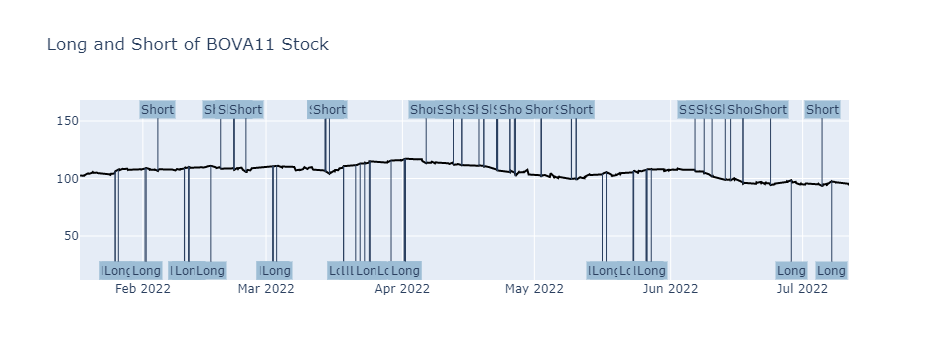

In [69]:
ticker = 'BOVA11' 
signal = get_long_short(close, lookback_high, lookback_low)
project_helper.plot_signal(
    close[ticker],
    signal[ticker],
    'Long and Short of {} Stock'.format(apple_ticker))

## Filter Signals
That was a lot of repeated signals! If we're already shorting a stock, having an additional signal to short a stock isn't helpful for this strategy. This also applies to additional long signals when the last signal was long.

Implement `filter_signals` to filter out repeated long or short signals within the `lookahead_days`. If the previous signal was the same, change the signal to `0` (do nothing signal). For example, say you have a single stock time series that is

`[1, 0, 1, 0, 1, 0, -1, -1]`

Running `filter_signals` with a lookahead of 3 days should turn those signals into

`[1, 0, 0, 0, 1, 0, -1, 0]`

To help you implement the function, we have provided you with the `clear_signals` function. This will remove all signals within a window after the last signal. For example, say you're using a windows size of 3 with `clear_signals`. It would turn the Series of long signals

`[0, 1, 0, 0, 1, 1, 0, 1, 0]`

into

`[0, 1, 0, 0, 0, 1, 0, 0, 0]`

`clear_signals` only takes a Series of the same type of signals, where `1` is the signal and `0` is no signal. It can't take a mix of long and short signals. Using this function, implement `filter_signals`. 

For implementing `filter_signals`, we don't reccommend you try to find a vectorized solution. Instead, you should use the [`iterrows`](https://pandas.pydata.org/pandas-docs/version/0.21/generated/pandas.DataFrame.iterrows.html) over each column.


## Filtro de Sinais
Foram muitos sinais repetidos! Se já estivermos vendendo uma ação, ter um sinal adicional para vender uma ação não é útil para essa estratégia. Isso também se aplica a sinais de compra adicionais quando o último sinal era de compra.

Implemente `filter_signals` para filtrar sinais longos ou curtos repetidos dentro de `lookahead_days`. Se o sinal anterior era o mesmo, altere o sinal para `0` (sinal de nada). Por exemplo, digamos que você tenha uma única série temporal de ações que é

`[1, 0, 1, 0, 1, 0, -1, -1]`

Executar `filter_signals` com uma antecipação de 3 dias deve transformar esses sinais em

`[1, 0, 0, 0, 1, 0, -1, 0]`

Para ajudá-lo a implementar a função, fornecemos a função `clear_signals`. Ela removerá todos os sinais de uma janela após o último sinal. Por exemplo, digamos que você esteja usando uma janela de tamanho 3 com `clear_signals`. Isso tornaria esta série de sinais longos

`[0, 1, 0, 0, 1, 1, 0, 1, 0]`

nesta aqui

`[0, 1, 0, 0, 0, 1, 0, 0, 0]`

`clear_signals` só aceita uma série do mesmo tipo de sinais, onde `1` é o sinal e `0` é nenhum sinal. Não é possível misturar sinais longos e curtos. Usando esta função, implemente `filter_signals`.

Para implementar `filter_signals`, não recomendamos que você tente encontrar uma solução vetorizada. Em vez disso, você deve usar o [`iterrows`](https://pandas.pydata.org/pandas-docs/version/0.21/generated/pandas.DataFrame.iterrows.html) em cada coluna.

In [65]:
cols = signal.columns
cols[1]
((signal[cols[2]]==-1).astype(np.int64)*-1).tail()
#top_stocks = [( row >= row.nlargest(top_n).min() ) for i,row in signal[cols[2]].iterrows()]

date
2022-07-08 17:00:00    0
2022-07-11 10:00:00    0
2022-07-11 11:00:00    0
2022-07-11 12:00:00    0
2022-07-11 13:00:00    0
Name: ALPA4, dtype: int64

In [46]:
#for col in signal.columns:
#    print(col)

In [74]:
def clear_signals(signals, window_size):
    """
    Clear out signals in a Series of just long or short signals.    
    Remove the number of signals down to 1 within the window size time period.
    
    Limpe os sinais em uma serie de sinais longos ou curtos.
    Reduza o numero de sinais para 1 dentro do período de tempo do tamanho da janela.    
    
    Parameters
    ----------
    signals : Pandas Series
        The long, short, or do nothing signals
    window_size : int
        The number of days to have a single signal       
    
    Returns
    -------
    signals : Pandas Series
        Signals with the signals removed from the window size
    """
    # Start with buffer of window size
    # This handles the edge case of calculating past_signal in the beginning
    
    # Comece com o buffer do tamanho da janela
    # Isso lida com o caso extremo de calcular past_signal no início
    clean_signals = [0]*window_size
    
    for signal_i, current_signal in enumerate(signals):
        # Check if there was a signal in the past window_size of days
        has_past_signal = bool(sum(clean_signals[signal_i:signal_i+window_size]))
        # Use the current signal if there's no past signal, else 0/False
        clean_signals.append(not has_past_signal and current_signal)
        
    # Remove buffer
    clean_signals = clean_signals[window_size:]

    # Return the signals as a Series of Ints
    return pd.Series(np.array(clean_signals).astype(np.int64), signals.index)


def filter_signals(signal, lookahead_days):
    """
    Filter out signals in a DataFrame.
    
    Parameters
    ----------
    signal : DataFrame
        The long, short, and do nothing signals for each ticker and date
    lookahead_days : int
        The number of days to look ahead
    
    Returns
    -------
    filtered_signal : DataFrame
        The filtered long, short, and do nothing signals for each ticker and date
    """
    #TODO: Implement function
    filtered_signal = signal.copy()
    for col in signal.columns:
        # colocando os sinais long e short em series separadas
        short = (signal[col]==-1).astype(np.int64)*-1
        long  = (signal[col]== 1).astype(np.int64)
        
        short_clean = clear_signals(short,lookahead_days-1)
        long_clean  = clear_signals(long ,lookahead_days-1)
        filtered_signal[col] = short_clean + long_clean 
    
    return filtered_signal

#project_tests.test_filter_signals(filter_signals)

### View Data
Let's view the same chart as before, but with the redundant signals removed.

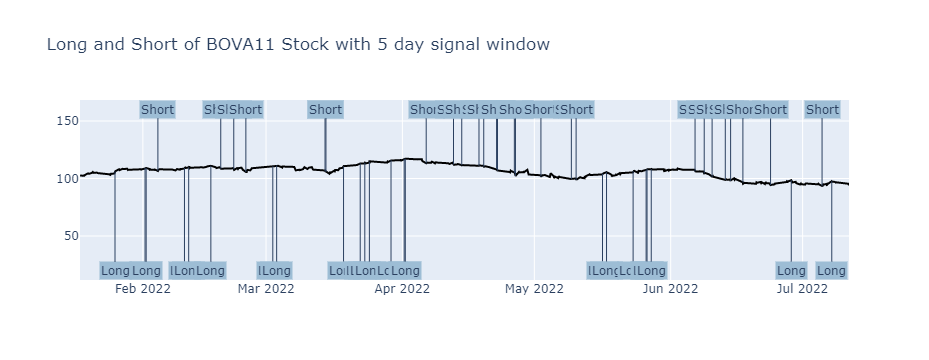

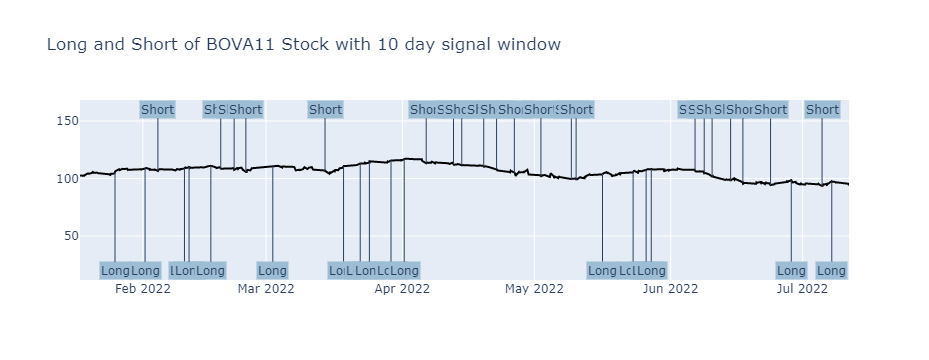

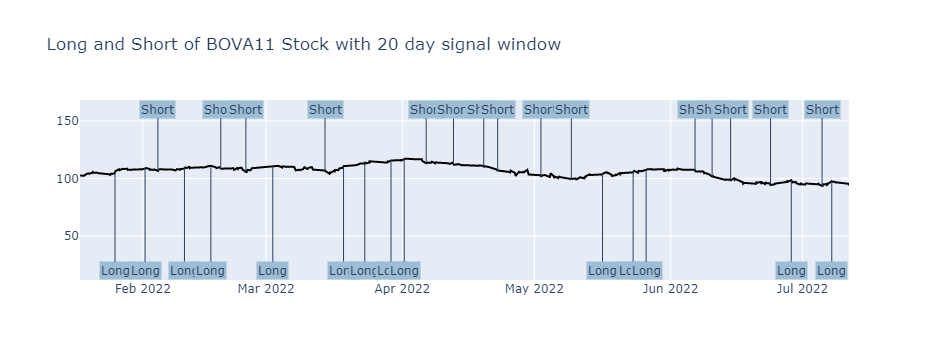

In [75]:
signal_5 = filter_signals(signal, 5)
signal_10 = filter_signals(signal, 10)
signal_20 = filter_signals(signal, 20)
for signal_data, signal_days in [(signal_5, 5), (signal_10, 10), (signal_20, 20)]:
    project_helper.plot_signal(
        close[ticker],
        signal_data[ticker],
        'Long and Short of {} Stock with {} day signal window'.format(ticker, signal_days))

## Lookahead Close Prices
With the trading signal done, we can start working on evaluating how many days to short or long the stocks. In this problem, implement `get_lookahead_prices` to get the close price days ahead in time. You can get the number of days from the variable `lookahead_days`. We'll use the lookahead prices to calculate future returns in another problem.

Com o sinal de negociação feito, podemos começar a trabalhar na avaliação de quantos dias para vender ou comprar as ações. Neste problema, implemente `get_lookahead_prices` para obter o preço de fechamento dias a frente no tempo. Você pode obter o número de dias da variável `lookahead_days`. Usaremos os preços antecipados para calcular retornos futuros em outro problema.

In [76]:
close.tail()

ticker,ABEV3,AERI3,ALPA4,ALSO3,AMBP3,AMER3,ANIM3,ASAI3,AZUL4,B3SA3,...,TAEE11,TOTS3,USIM5,VALE3,VAMO3,VBBR3,VIIA3,WEGE3,XPBR31,YDUQ3
date,,,,,,,,,,,,,,,,,,,,,
2022-07-08 17:00:00,14.35000000,2.66000000,20.55000000,16.74000000,24.65000000,15.90000000,4.27000000,15.29000000,12.46000000,11.46000000,...,39.07000000,24.80000000,8.63000000,75.19000000,11.49000000,16.58000000,2.44000000,27.24000000,97.10000000,14.81000000
2022-07-11 10:00:00,14.25000000,2.60000000,19.82000000,16.29000000,24.07000000,15.46000000,4.24000000,15.19000000,11.77000000,10.94000000,...,39.18000000,23.96000000,8.40000000,73.30000000,11.12000000,16.45000000,2.34000000,26.53000000,93.44000000,14.54000000
2022-07-11 11:00:00,14.17000000,2.64000000,19.73000000,16.43000000,23.86000000,15.58000000,4.32000000,15.16000000,11.69000000,10.88000000,...,39.10000000,23.93000000,8.45000000,72.90000000,11.07000000,16.29000000,2.33000000,26.44000000,93.54000000,14.37000000
2022-07-11 12:00:00,14.08000000,2.71000000,20.05000000,16.49000000,24.17000000,15.79000000,4.42000000,15.35000000,11.71000000,10.90000000,...,39.29000000,24.04000000,8.55000000,73.12000000,11.04000000,16.34000000,2.37000000,26.58000000,93.00000000,14.69000000
2022-07-11 13:00:00,14.16000000,2.65000000,20.13000000,16.39000000,23.91000000,15.80000000,4.39000000,15.35000000,11.67000000,10.88000000,...,39.24000000,24.10000000,8.40000000,72.89000000,10.93000000,16.36000000,2.37000000,26.53000000,92.88000000,14.57000000


In [77]:
close.shift(-1).tail()

ticker,ABEV3,AERI3,ALPA4,ALSO3,AMBP3,AMER3,ANIM3,ASAI3,AZUL4,B3SA3,...,TAEE11,TOTS3,USIM5,VALE3,VAMO3,VBBR3,VIIA3,WEGE3,XPBR31,YDUQ3
date,,,,,,,,,,,,,,,,,,,,,
2022-07-08 17:00:00,14.25000000,2.60000000,19.82000000,16.29000000,24.07000000,15.46000000,4.24000000,15.19000000,11.77000000,10.94000000,...,39.18000000,23.96000000,8.40000000,73.30000000,11.12000000,16.45000000,2.34000000,26.53000000,93.44000000,14.54000000
2022-07-11 10:00:00,14.17000000,2.64000000,19.73000000,16.43000000,23.86000000,15.58000000,4.32000000,15.16000000,11.69000000,10.88000000,...,39.10000000,23.93000000,8.45000000,72.90000000,11.07000000,16.29000000,2.33000000,26.44000000,93.54000000,14.37000000
2022-07-11 11:00:00,14.08000000,2.71000000,20.05000000,16.49000000,24.17000000,15.79000000,4.42000000,15.35000000,11.71000000,10.90000000,...,39.29000000,24.04000000,8.55000000,73.12000000,11.04000000,16.34000000,2.37000000,26.58000000,93.00000000,14.69000000
2022-07-11 12:00:00,14.16000000,2.65000000,20.13000000,16.39000000,23.91000000,15.80000000,4.39000000,15.35000000,11.67000000,10.88000000,...,39.24000000,24.10000000,8.40000000,72.89000000,10.93000000,16.36000000,2.37000000,26.53000000,92.88000000,14.57000000
2022-07-11 13:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [79]:
def get_lookahead_prices(close, lookahead_days):
    """
    Get the lookahead prices for `lookahead_days` number of days.
    
    Parameters
    ----------
    close : DataFrame
        Close price for each ticker and date
    lookahead_days : int
        The number of days to look ahead
    
    Returns
    -------
    lookahead_prices : DataFrame
        The lookahead prices for each ticker and date
    """
    #TODO: Implement function
    lookahead_prices = close.shift(-lookahead_days)
    
    return lookahead_prices

#project_tests.test_get_lookahead_prices(get_lookahead_prices)

### View Data
Using the `get_lookahead_prices` function, let's generate lookahead closing prices for 5, 10, and 20 days.

Let's also chart a subsection of a few months of the Apple stock instead of years. This will allow you to view the differences between the 5, 10, and 20 day lookaheads. Otherwise, they will mesh together when looking at a chart that is zoomed out.


Usando a função `get_lookahead_prices`, vamos gerar preços de fechamento antecipados para 5, 10 e 20 dias.

Vamos também fazer um gráfico de uma subseção de alguns meses das ações da Apple em vez de anos. Isso permitirá que você visualize as diferenças entre as antecipações de 5, 10 e 20 dias. Caso contrário, eles irão se misturar ao olhar para um gráfico com zoom reduzido.

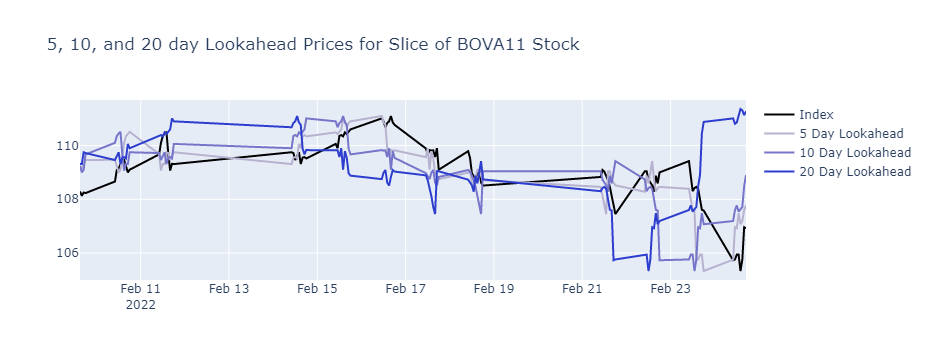

In [87]:
lookahead_5 = get_lookahead_prices(close, 5)
lookahead_10 = get_lookahead_prices(close, 10)
lookahead_20 = get_lookahead_prices(close, 20)
project_helper.plot_lookahead_prices(
    close[ticker].iloc[150:250],
    [
        (lookahead_5[ticker].iloc[150:250], 5),
        (lookahead_10[ticker].iloc[150:250], 10),
        (lookahead_20[ticker].iloc[150:250], 20)],
    '5, 10, and 20 day Lookahead Prices for Slice of {} Stock'.format(apple_ticker))

## Lookahead Price Returns
Implement `get_return_lookahead` to generate the log price return between the closing price and the lookahead price.

In [89]:
def get_return_lookahead(close, lookahead_prices):
    """
    Calculate the log returns from the lookahead days to the signal day.
    
    Parameters
    ----------
    close : DataFrame
        Close price for each ticker and date
    lookahead_prices : DataFrame
        The lookahead prices for each ticker and date
    
    Returns
    -------
    lookahead_returns : DataFrame
        The lookahead log returns for each ticker and date
    """
    #TODO: Implement function
    lookahead_returns = np.log(lookahead_prices) - np.log(close)
    
    return lookahead_returns

#project_tests.test_get_return_lookahead(get_return_lookahead)

### View Data
Using the same lookahead prices and same subsection of the Apple stock from the previous problem, we'll view the lookahead returns.

In order to view price returns on the same chart as the stock, a second y-axis will be added. When viewing this chart, the axis for the price of the stock will be on the left side, like previous charts. The axis for price returns will be located on the right side.


Usando os mesmos preços antecipados e a mesma subseção das ações da Apple do problema anterior, veremos os retornos antecipados.

Para visualizar os retornos dos preços no mesmo gráfico da ação, um segundo eixo y será adicionado. Ao visualizar este gráfico, o eixo para o preço da ação estará no lado esquerdo, como os gráficos anteriores. O eixo para retornos de preços estará localizado no lado direito.

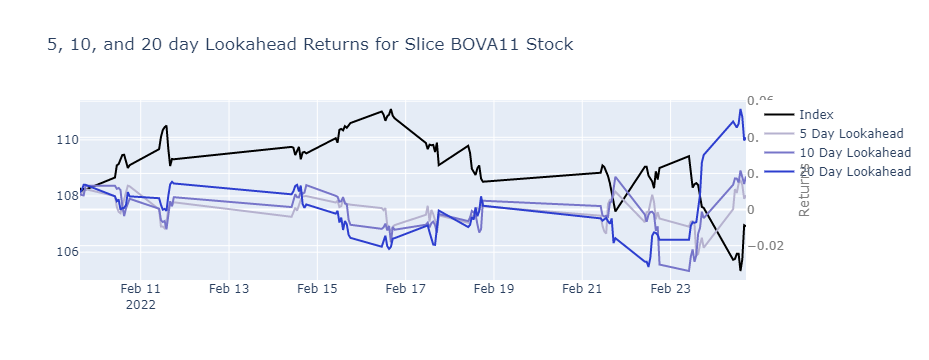

In [90]:
price_return_5 = get_return_lookahead(close, lookahead_5)
price_return_10 = get_return_lookahead(close, lookahead_10)
price_return_20 = get_return_lookahead(close, lookahead_20)
project_helper.plot_price_returns(
    close[apple_ticker].iloc[150:250],
    [
        (price_return_5[apple_ticker].iloc[150:250], 5),
        (price_return_10[apple_ticker].iloc[150:250], 10),
        (price_return_20[apple_ticker].iloc[150:250], 20)],
    '5, 10, and 20 day Lookahead Returns for Slice {} Stock'.format(apple_ticker))

## Compute the Signal Return
Using the price returns generate the signal returns.

Usando os retornos do preço, gere os retornos do sinal.

In [92]:
def get_signal_return(signal, lookahead_returns):
    """
    Compute the signal returns.
    
    Parameters
    ----------
    signal : DataFrame
        The long, short, and do nothing signals for each ticker and date
    lookahead_returns : DataFrame
        The lookahead log returns for each ticker and date
    
    Returns
    -------
    signal_return : DataFrame
        Signal returns for each ticker and date
    """
    #TODO: Implement function
    signal_return = signal * lookahead_returns
    
    return signal_return

#project_tests.test_get_signal_return(get_signal_return)

### View Data
Let's continue using the previous lookahead prices to view the signal returns. Just like before, the axis for the signal returns is on the right side of the chart.

Vamos continuar usando os preços antecipados anteriores para visualizar os retornos do sinal. Assim como antes, o eixo para os retornos do sinal está no lado direito do gráfico.

## Test for Significance
### Histogram
Let's plot a histogram of the signal return values.

Vamos plotar um histograma dos valores de retorno do sinal.

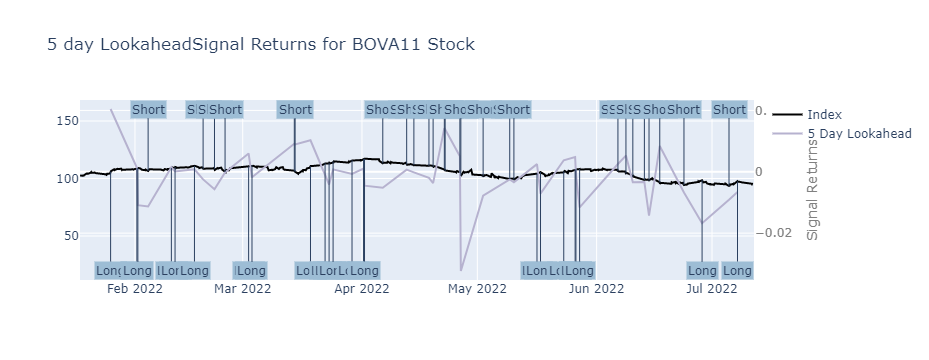

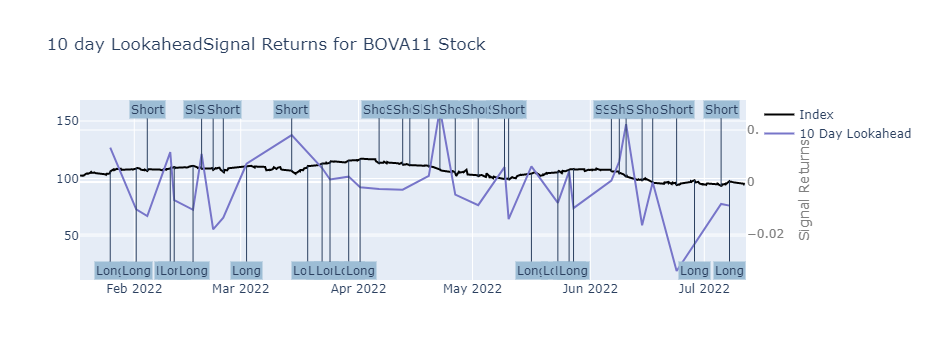

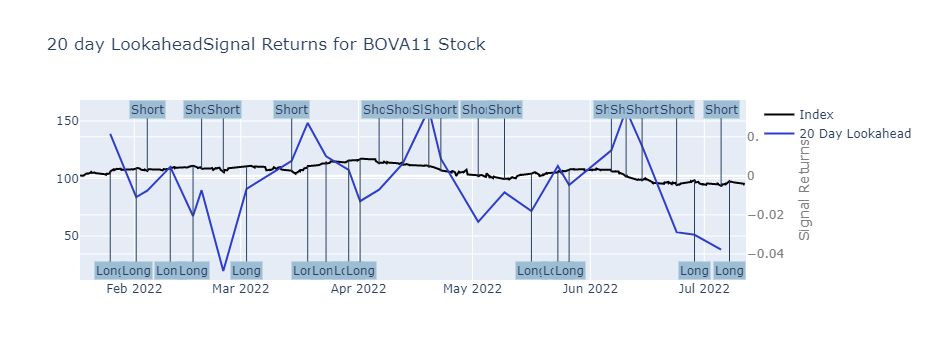

In [93]:
title_string = '{} day LookaheadSignal Returns for {} Stock'
signal_return_5 = get_signal_return(signal_5, price_return_5)
signal_return_10 = get_signal_return(signal_10, price_return_10)
signal_return_20 = get_signal_return(signal_20, price_return_20)
project_helper.plot_signal_returns(
    close[apple_ticker],
    [
        (signal_return_5[apple_ticker], signal_5[apple_ticker], 5),
        (signal_return_10[apple_ticker], signal_10[apple_ticker], 10),
        (signal_return_20[apple_ticker], signal_20[apple_ticker], 20)],
    [title_string.format(5, apple_ticker), title_string.format(10, apple_ticker), title_string.format(20, apple_ticker)])

D:\programs\python\python310\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



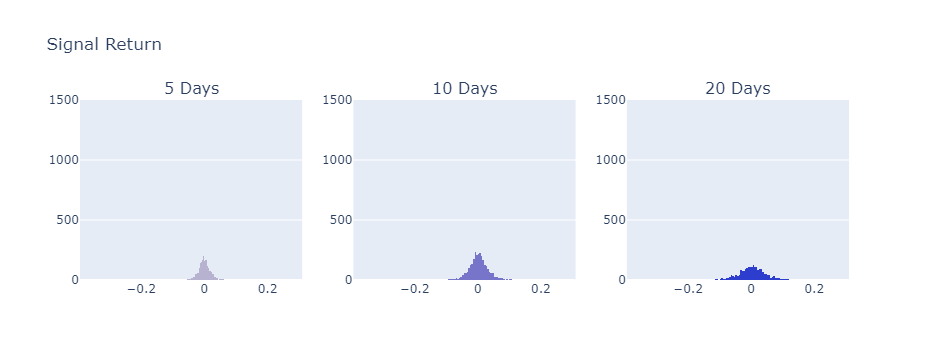

In [94]:
project_helper.plot_signal_histograms(
    [signal_return_5, signal_return_10, signal_return_20],
    'Signal Return',
    ('5 Days', '10 Days', '20 Days'))

### Question: What do the histograms tell you about the signal returns?

*#TODO: Put Answer In this Cell*

## Outliers
You might have noticed the outliers in the 10 and 20 day histograms. To better visualize the outliers, let's compare the 5, 10, and 20 day signals returns to normal distributions with the same mean and deviation for each signal return distributions.

Você deve ter notado os outliers nos histogramas de 10 e 20 dias. Para visualizar melhor os outliers, vamos comparar os retornos dos sinais de 5, 10 e 20 dias às distribuições normais com a mesma média e desvio para cada distribuição de retorno do sinal.

D:\programs\python\python310\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



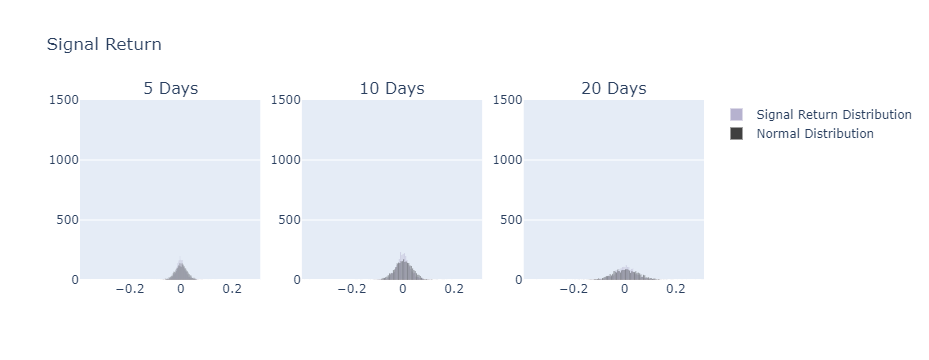

In [95]:
project_helper.plot_signal_to_normal_histograms(
    [signal_return_5, signal_return_10, signal_return_20],
    'Signal Return',
    ('5 Days', '10 Days', '20 Days'))

## Kolmogorov-Smirnov Test
While you can see the outliers in the histogram, we need to find the stocks that are causing these outlying returns. We'll use the Kolmogorov-Smirnov Test or KS-Test. This test will be applied to teach ticker's signal returns where a long or short signal exits.

Embora você possa ver os outliers no histograma, precisamos encontrar as ações que estão causando esses retornos outliers. Usaremos o Teste de Kolmogorov-Smirnov ou Teste KS. Este teste será aplicado para ensinar os retornos do sinal do ticker onde sai um sinal longo ou curto.

In [59]:
#signal_return_5.head().stack().head()
#signal_return_5[signal_5 != 0].stack()
#signal_return_5.stack()


In [96]:
# Filter out returns that don't have a long or short signal.
long_short_signal_returns_5 = signal_return_5[signal_5 != 0].stack()
long_short_signal_returns_10 = signal_return_10[signal_10 != 0].stack()
long_short_signal_returns_20 = signal_return_20[signal_20 != 0].stack()

# Get just ticker and signal return
long_short_signal_returns_5 = long_short_signal_returns_5.reset_index().iloc[:, [1,2]]
long_short_signal_returns_5.columns = ['ticker', 'signal_return']
long_short_signal_returns_10 = long_short_signal_returns_10.reset_index().iloc[:, [1,2]]
long_short_signal_returns_10.columns = ['ticker', 'signal_return']
long_short_signal_returns_20 = long_short_signal_returns_20.reset_index().iloc[:, [1,2]]
long_short_signal_returns_20.columns = ['ticker', 'signal_return']

# View some of the data
long_short_signal_returns_5.head(10)

,ticker,signal_return
0,BBAS3,0.01031420
1,BEEF3,-0.01343689
2,CRFB3,0.01761873
3,PETR3,0.01345463
4,PETR4,0.01559052
5,ALSO3,-0.00045756
6,BBDC4,0.00499434
7,BPAC11,0.04855535
8,JBSS3,-0.02033213
9,LIGT3,0.01180223


In [100]:
from scipy import stats

In [101]:
df = long_short_signal_returns_5
#df['ticker'].value_counts()
#df['ticker'].value_counts(normalize=True)
#dfg = df.groupby(['ticker'])
#dfg.head()
dfg = df.groupby(['ticker'])
dfg.get_group(apple_ticker)['signal_return']
dfg.get_group(apple_ticker)
dfg.count().index
#dfg.groups
#dfg.columns

#ksv,pv = [ kstest( dfg(i)['signal_return'] ) for i,_ in dfg.count().iterrows() ]

#ksv,pv = [ kstest( dfg(i)['signal_return'] ) for i,_ in df.groupby(['ticker']).count().iterrows() ]

#ksv,pv = [ kstest( dfg(i)['signal_return'] ) for i, in dfg.groups ]

#ksv,pv = [ kstest( data, 'norm' ) for i,data in dfg.groups ]
#pv.head()

#ksv,pv = [ kstest( data, 'norm' ) for i,data in dfg ]
#pv.head()

#for i,data in dfg:
#    print(i)
#    print(data['signal_return'])

#ksv,pv = 
#ind,ksresult = [ ( i, kstest( data['signal_return'], 'norm' ) ) for i,data in dfg ]
#ksresult
#pv.head()

vind = []
vkst = []
vpv  = []
for i,data in dfg:
    
    kst,pv = stats.kstest( data['signal_return'], 'norm' )
    vind.append(i)
    vkst.append(kst)
    vpv.append(pv)

pd.Series(vpv , index=vind)
pd.Series(vkst, index=vind)
len(vind)

#pd.DataFrame(ksresult).head()
#df.head()

#pd.DataFrame(ksresult)['statistic']


98

In [104]:
#spl = [0.12,  0.83, -0.68, 0.57, -0.97] # 0.29787827, 0.69536353
#spl = [-0.83,-0.34,  0.29, 0.39, -0.72] # 0.35221525, 0.46493498
spl = [ 0.37, 0.27,  0.69, 0.56,  0.26] # 0.63919407, 0.01650327
#spl  = [ 0.26, 0.27,  0.37, 0.56,  0.69] # 0.63919407, 0.01650327


media = np.mean(spl)
desvio = np.std(spl,ddof=0)
normal_args = (media,desvio)
print('mean e dp ori:',media,desvio)

#ks,pv = kstest( spl, 'norm'                                                      )
ks,pv = stats.kstest(spl, 'norm', args=normal_args                                         )
#ks,pv = kstest(spl, 'norm', normal_args, N=len(spl)                              )
#ks,pv = kstest(spl, 'norm', normal_args, alternative='two-sided', mode='asymp' )
print('ks e pv ori:',ks,pv)

splp = (spl-media)/desvio
#mean = np.mean(splp)
#dp   = np.std(splp,ddof=0)
#normal_args = (mean,dp)
ks,pv = stats.kstest(splp, 'norm', args=normal_args                                   )
#ks,pv = kstest(splp, 'norm', normal_args, N=len(splp)                           )
#ks,pv = kstest(splp, 'norm', normal_args, alternative='two-sided', mode='asymp')
print('ks e pv prep:',ks,pv)

mean e dp ori: 0.43000000000000005 0.1688786546606764
ks e pv ori: 0.23881183701141995 0.8774934903872869
ks e pv prep: 0.5999983402744906 0.030080717008031388


This gives you the data to use in the KS-Test.

Now it's time to implement the function `calculate_kstest` to use Kolmogorov-Smirnov test (KS test) between a distribution of stock returns (the input dataframe in this case) and each stock's signal returns. Run KS test on a normal distribution against each stock's signal returns. Use [`scipy.stats.kstest`](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.kstest.html#scipy-stats-kstest) perform the KS test. When calculating the standard deviation of the signal returns, make sure to set the delta degrees of freedom to 0.

For this function, we don't reccommend you try to find a vectorized solution. Instead, you should iterate over the [`groupby`](https://pandas.pydata.org/pandas-docs/version/0.21/generated/pandas.DataFrame.groupby.html) function.


Isso fornece os dados para usar no teste KS.

Agora é hora de implementar a função `calculate_kstest` para usar o teste de Kolmogorov-Smirnov (teste KS) entre uma distribuição de retornos de ações (o dataframe de entrada neste caso) e os retornos de sinal de cada ação. Execute o teste KS em uma distribuição normal em relação aos retornos de sinal de cada ação. Use [`scipy.stats.kstest`](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.kstest.html#scipy-stats-kstest) execute o KS teste. Ao calcular o desvio padrão dos retornos do sinal, certifique-se de definir os graus delta de liberdade para 0.

OBS: CDF deve ser todo o portifolio de acoes e nao apenas a acao isolada para a qual estamos aplicando o teste. RVF sim eh uma acao isolada.

Para esta função, não recomendamos que você tente encontrar uma solução vetorizada. Em vez disso, você deve iterar na função [`groupby`](https://pandas.pydata.org/pandas-docs/version/0.21/generated/pandas.DataFrame.groupby.html).

In [106]:
from scipy.stats import kstest


def calculate_kstest(long_short_signal_returns):
    """
    Calculate the KS-Test against the signal returns with a long or short signal.
    
    Parameters
    ----------
    long_short_signal_returns : DataFrame
        The signal returns which have a signal.
        This DataFrame contains two columns, "ticker" and "signal_return"
    
    Returns
    -------
    ks_values : Pandas Series
        KS static for all the tickers
    p_values : Pandas Series
        P value for all the tickers
    """
    #TODO: Implement function
    
    #grouping...
    portfolio_mean = long_short_signal_returns.mean()
    portfolio_std  = long_short_signal_returns.std(ddof=0)
    dfg = long_short_signal_returns.groupby(['ticker'],sort=False)

    normal_args = ( portfolio_mean, portfolio_std )
    
    vind = []
    vkst = []
    vpv  = []
    # for each group...
    for i,data in dfg:

        sample = data['signal_return']
        #print(i)
        #print(data)
        #print(sample)
        #print(i, normal_args )
        #print(samplet)
        
        
        #kst,pv = kstest( sample, 'norm', normal_args, alternative='greater' )
        #kst,pv = kstest( sample, 'norm', normal_args, alternative='less' )
        #kst,pv = kstest( sample, 'norm', normal_args, N=len(sample), alternative='less' )
        kst,pv  = kstest( sample, 'norm', normal_args )
        vind.append(i)
        vkst.append(kst)
        vpv.append(pv)
        #print(i,kst,pv )
    
    ks_values=pd.Series(vkst, index=vind)
    p_values =pd.Series(vpv , index=vind)

    return ks_values, p_values


#project_tests.test_calculate_kstest(calculate_kstest)

### View Data
Using the signal returns we created above, let's calculate the ks and p values.

In [107]:
ks_values_5, p_values_5 = calculate_kstest(long_short_signal_returns_5)
ks_values_10, p_values_10 = calculate_kstest(long_short_signal_returns_10)
ks_values_20, p_values_20 = calculate_kstest(long_short_signal_returns_20)

print('ks_values_5')
print(ks_values_5.head(10))
print('p_values_5')
print(p_values_5.head(10))

C:\Users\marco\AppData\Local\Temp\ipykernel_13812\3951124526.py:24: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\marco\AppData\Local\Temp\ipykernel_13812\3951124526.py:25: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\marco\AppData\Local\Temp\ipykernel_13812\3951124526.py:24: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\marco\AppData\Local\Temp\ipykernel_13812\3951124526.py:25: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'nume

ks_values_5
BBAS3    0.17106307
BEEF3    0.11717769
CRFB3    0.20367813
PETR3    0.15095272
PETR4    0.18928885
ALSO3    0.20858956
BBDC4    0.25774272
BPAC11   0.17476800
JBSS3    0.19671177
LIGT3    0.11739124
dtype: float64
p_values_5
BBAS3    0.27370022
BEEF3    0.60076071
CRFB3    0.05732602
PETR3    0.52112640
PETR4    0.19052702
ALSO3    0.07492260
BBDC4    0.00266848
BPAC11   0.16371258
JBSS3    0.13558883
LIGT3    0.62920259
dtype: float64


C:\Users\marco\AppData\Local\Temp\ipykernel_13812\3951124526.py:24: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\marco\AppData\Local\Temp\ipykernel_13812\3951124526.py:25: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



## Find Outliers
With the ks and p values calculate, let's find which symbols are the outliers. Implement the `find_outliers` function to find the following outliers:
- Symbols that pass the null hypothesis with a p-value less than `pvalue_threshold` **AND** with a KS value above `ks_threshold`.

*Note: your function should return symbols that meet both requirements above.*


Com os valores ks e p calculados, vamos descobrir quais símbolos são os outliers. Implemente a função `find_outliers` para encontrar os seguintes outliers:
- Símbolos que passam a hipótese nula com um valor p menor que `pvalue_threshold` **AND** com um valor KS acima de `ks_threshold`.

*Observação: sua função deve retornar símbolos que atendam a ambos os requisitos acima.*

In [134]:
def find_outliers(ks_values, p_values, ks_threshold, pvalue_threshold=0.05):
    """
    Find outlying symbols using KS values and P-values
    
    Parameters
    ----------
    ks_values : Pandas Series
        KS static for all the tickers
    p_values : Pandas Series
        P value for all the tickers
    ks_threshold : float
        The threshold for the KS statistic
    pvalue_threshold : float
        The threshold for the p-value
    
    Returns
    -------
    outliers : set of str
        Symbols that are outliers
    """
    
    #TODO: Implement function
    r = (ks_values > ks_threshold) & (p_values  < pvalue_threshold)
    r = r.loc[r&True]

    outliers = set(np.array(r.index))
    return outliers


project_tests.test_find_outliers(find_outliers)

Tests Passed


### View Data
Using the `find_outliers` function you implemented, let's see what we found.

In [136]:
ks_threshold = 0.8
outliers_5 = find_outliers(ks_values_5, p_values_5, ks_threshold)
outliers_10 = find_outliers(ks_values_10, p_values_10, ks_threshold)
outliers_20 = find_outliers(ks_values_20, p_values_20, ks_threshold)

outlier_tickers = outliers_5.union(outliers_10).union(outliers_20)
print('{} Outliers Found:\n{}'.format(len(outlier_tickers), ', '.join(list(outlier_tickers))))

24 Outliers Found:
TURKES, KAUFMA, GESNER, HUMILI, URUMIE, CLUSIA, GREIGI, SCHREN, ORPHAN, BIFLOR, LINIFO, ALTAIC, SPRENG, SAXATI, SYLVES, TARDA, KOLPAK, VVEDEN, PULCHE, BAKERI, AGENEN, DASYST, ARMENA, PRAEST


### Show Significance without Outliers
Let's compare the 5, 10, and 20 day signals returns without outliers to normal distributions. Also, let's see how the P-Value has changed with the outliers removed.

Vamos comparar os retornos dos sinais de 5, 10 e 20 dias sem outliers com as distribuições normais. Além disso, vamos ver como o P-Value mudou com os outliers removidos.

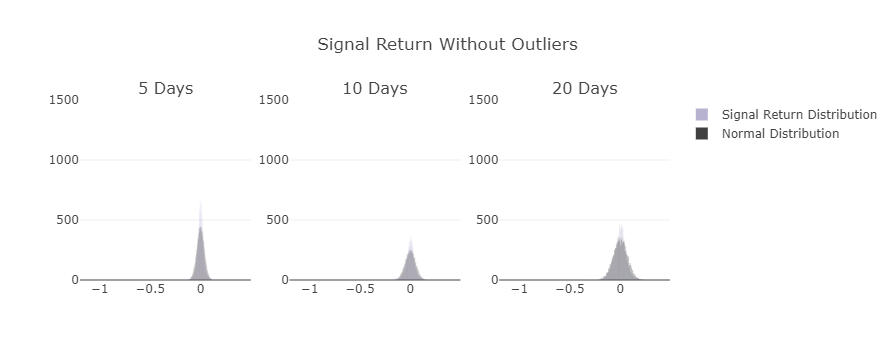

In [143]:
good_tickers = list(set(close.columns) - outlier_tickers)

project_helper.plot_signal_to_normal_histograms(
    [signal_return_5[good_tickers], signal_return_10[good_tickers], signal_return_20[good_tickers]],
    'Signal Return Without Outliers',
    ('5 Days', '10 Days', '20 Days'))

That's more like it! The returns are closer to a normal distribution. You have finished the research phase of a Breakout Strategy. You can now submit your project.
## Submission
Now that you're done with the project, it's time to submit it. Click the submit button in the bottom right. One of our reviewers will give you feedback on your project with a pass or not passed grade. You can continue to the next section while you wait for feedback.



É mais assim! Os retornos estão mais próximos de uma distribuição normal. Você concluiu a fase de pesquisa de uma Estratégia de Breakout. Agora você pode enviar seu projeto.
## Submissão
Agora que você concluiu o projeto, é hora de enviá-lo. Clique no botão enviar no canto inferior direito. Um de nossos revisores lhe dará feedback sobre seu projeto com aprovação ou reprovação. Você pode passar para a próxima seção enquanto aguarda o feedback.